J’ai choisi de travailler sur cette base de données des accidents d’aviation disponible sur Kaggle car elle traite d’un sujet à fort impact humain et technique. Comprendre les causes et les circonstances des accidents aériens peut contribuer à améliorer la sécurité dans l’aviation civile. Ce jeu de données est riche, multidimensionnel (conditions météo, phases de vol, types d'appareils, gravité des accidents, etc.), ce qui en fait un bon terrain pour l'exploration, la visualisation et la modélisation.

De plus, il offre des opportunités concrètes de poser des problématique réelle comme : peut-on prédire si un accident sera mortel ? Enfin, l’analyse de ce type de données permet de sensibiliser aux enjeux de sécurité et de prévention dans un domaine où chaque décision peut sauver des vies.

#data['Fatal_Accident'] = (data['Total.Fatal.Injuries'] > 0).astype(int) 
J’ai crée et choisi la colonne Fatal_Accident comme cible car elle indique si un accident a causé au moins un mort. C’est une donnée claire et importante. Mon objectif est de faire une étude de classification pour prédire si un accident sera fatal ou non, en fonction de plusieurs facteurs comme la météo, le type d’avion ou la phase de vol. Cela permet de mieux comprendre les situations les plus à risque.

In [205]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
data = pd.read_csv(r"C:\Users\khema\Downloads\Aviation_Accidents\AviationData.csv", encoding='cp1252')

data.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,20001218X45444,Accident,SEA87LA080,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,UNK,Cruise,Probable Cause,NaN
1,20001218X45447,Accident,LAX94LA336,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,4.0,0.0,0.0,0.0,UNK,Unknown,Probable Cause,19-09-1996
2,20061025X01555,Accident,NYC07LA005,1974-08-30,"Saltville, VA",United States,36.922223,-81.878056,NaN,NaN,...,Personal,NaN,3.0,NaN,NaN,NaN,IMC,Cruise,Probable Cause,26-02-2007
3,20001218X45448,Accident,LAX96LA321,1977-06-19,"EUREKA, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,IMC,Cruise,Probable Cause,12-09-2000
4,20041105X01764,Accident,CHI79FA064,1979-08-02,"Canton, OH",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,1.0,2.0,NaN,0.0,VMC,Approach,Probable Cause,16-04-1980


In [206]:
data.columns

Index(['Event.Id', 'Investigation.Type', 'Accident.Number', 'Event.Date',
       'Location', 'Country', 'Latitude', 'Longitude', 'Airport.Code',
       'Airport.Name', 'Injury.Severity', 'Aircraft.damage',
       'Aircraft.Category', 'Registration.Number', 'Make', 'Model',
       'Amateur.Built', 'Number.of.Engines', 'Engine.Type', 'FAR.Description',
       'Schedule', 'Purpose.of.flight', 'Air.carrier', 'Total.Fatal.Injuries',
       'Total.Serious.Injuries', 'Total.Minor.Injuries', 'Total.Uninjured',
       'Weather.Condition', 'Broad.phase.of.flight', 'Report.Status',
       'Publication.Date'],
      dtype='object')

EXPLICATION DES COLONNES : 

Tout ce qui est identifiants et informations générales :
Event.Id : Identifiant unique de l’événement.

Accident.Number : Numéro d'accident attribué par l'autorité.

Investigation.Type : Type d’enquête (: Accident, Incident).

Event.Date : Date de l’événement.

Report.Status : Statut du rapport (ex. : Preliminaire, Final).

Publication.Date : Date de publication du rapport.

Lieu :
Location : Localisation spécifique (ville/état).

Country : Pays.

Latitude / Longitude : Coordonnées géographiques.

Airport.Code / Airport.Name : Code et nom de l’aéroport associé.

Informations sur l’appareil :
Registration.Number : Immatriculation.

Make : Constructeur (ex. : Boeing, Cessna).

Model : Modèle de l’avion.

Aircraft.Category : Catégorie de l’aéronef (avion, hélicoptère, etc.).

Aircraft.damage : Niveau de dommage subi.

Amateur.Built : Si l’appareil a été construit par un amateur (oui/non).

Number.of.Engines : Nombre de moteurs.

Engine.Type : Type de moteur.

Détails du vol :
FAR.Description : Réglementation applicable au vol.

Schedule : Vol régulier ou non (Scheduled/Unscheduled).

Purpose.of.flight : But du vol (formation, transport, etc.).

Air.carrier : Compagnie aérienne.

Conditions de l’accident :
Injury.Severity : Gravité de l’événement.

Total.Fatal.Injuries / Serious / Minor / Uninjured : Nombre de victimes par gravité.

Weather.Condition : Conditions météorologiques.

Broad.phase.of.flight : Phase du vol durant l’événement (décollage, croisière, etc.).

In [207]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88889 entries, 0 to 88888
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Event.Id                88889 non-null  object 
 1   Investigation.Type      88889 non-null  object 
 2   Accident.Number         88889 non-null  object 
 3   Event.Date              88889 non-null  object 
 4   Location                88837 non-null  object 
 5   Country                 88663 non-null  object 
 6   Latitude                34382 non-null  object 
 7   Longitude               34373 non-null  object 
 8   Airport.Code            50132 non-null  object 
 9   Airport.Name            52704 non-null  object 
 10  Injury.Severity         87889 non-null  object 
 11  Aircraft.damage         85695 non-null  object 
 12  Aircraft.Category       32287 non-null  object 
 13  Registration.Number     87507 non-null  object 
 14  Make                    88826 non-null

In [208]:
data.describe()

,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
count,82805.000000,77488.000000,76379.000000,76956.000000,82977.000000
mean,1.146585,0.647855,0.279881,0.357061,5.325440
std,0.446510,5.485960,1.544084,2.235625,27.913634
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,0.000000,0.000000,0.000000,2.000000
max,8.000000,349.000000,161.000000,380.000000,699.000000


In [209]:
data.isnull().sum()

Event.Id                      0
Investigation.Type            0
Accident.Number               0
Event.Date                    0
Location                     52
Country                     226
Latitude                  54507
Longitude                 54516
Airport.Code              38757
Airport.Name              36185
Injury.Severity            1000
Aircraft.damage            3194
Aircraft.Category         56602
Registration.Number        1382
Make                         63
Model                        92
Amateur.Built               102
Number.of.Engines          6084
Engine.Type                7096
FAR.Description           56866
Schedule                  76307
Purpose.of.flight          6192
Air.carrier               72241
Total.Fatal.Injuries      11401
Total.Serious.Injuries    12510
Total.Minor.Injuries      11933
Total.Uninjured            5912
Weather.Condition          4492
Broad.phase.of.flight     27165
Report.Status              6384
Publication.Date          13771
dtype: i

In [97]:
from ydata_profiling import ProfileReport
profile = ProfileReport(data, title="Rapport Aviation Acciedents")
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [00:10<00:00,  2.99it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

J'ai décidé de réduire ma data et de travailler que sur les colonnes qui m'intéressent. 

In [210]:
data = data[['Investigation.Type','Aircraft.damage','Aircraft.Category',
            'Number.of.Engines','Engine.Type','Purpose.of.flight',
            'Total.Fatal.Injuries','Total.Serious.Injuries','Total.Minor.Injuries',
            'Total.Uninjured','Weather.Condition','Broad.phase.of.flight','Event.Date','Country','Make']]

data.head(20)

,Investigation.Type,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Purpose.of.flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Event.Date,Country,Make
0,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,2.0,0.0,0.0,0.0,UNK,Cruise,1948-10-24,United States,Stinson
1,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,4.0,0.0,0.0,0.0,UNK,Unknown,1962-07-19,United States,Piper
2,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,3.0,NaN,NaN,NaN,IMC,Cruise,1974-08-30,United States,Cessna
3,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,2.0,0.0,0.0,0.0,IMC,Cruise,1977-06-19,United States,Rockwell
4,Accident,Destroyed,NaN,NaN,NaN,Personal,1.0,2.0,NaN,0.0,VMC,Approach,1979-08-02,United States,Cessna
5,Accident,Substantial,Airplane,2.0,Turbo Fan,NaN,NaN,NaN,1.0,44.0,VMC,Climb,1979-09-17,United States,Mcdonnell Douglas
6,Accident,Destroyed,NaN,1.0,Reciprocating,Personal,4.0,0.0,0.0,0.0,IMC,Unknown,1981-08-01,United States,Cessna
7,Accident,Substantial,Airplane,1.0,Reciprocating,Personal,0.0,0.0,0.0,2.0,VMC,Takeoff,1982-01-01,United States,Cessna
8,Accident,Substantial,Airplane,2.0,Reciprocating,Business,0.0,0.0,0.0,2.0,IMC,Landing,1982-01-01,United States,Cessna
9,Accident,Substantial,NaN,1.0,Reciprocating,Personal,0.0,0.0,3.0,0.0,IMC,Cruise,1982-01-01,United States,North American


In [211]:
data=data.drop_duplicates()   #j'ai retiré les dupliquées 

Je refais mon exploration selon la nouvelle data que j'ai 

In [212]:
data.info()   

<class 'pandas.core.frame.DataFrame'>
Index: 88140 entries, 0 to 88888
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Investigation.Type      88140 non-null  object 
 1   Aircraft.damage         84953 non-null  object 
 2   Aircraft.Category       31990 non-null  object 
 3   Number.of.Engines       82070 non-null  float64
 4   Engine.Type             81061 non-null  object 
 5   Purpose.of.flight       81960 non-null  object 
 6   Total.Fatal.Injuries    76812 non-null  float64
 7   Total.Serious.Injuries  75711 non-null  float64
 8   Total.Minor.Injuries    76287 non-null  float64
 9   Total.Uninjured         82239 non-null  float64
 10  Weather.Condition       83659 non-null  object 
 11  Broad.phase.of.flight   61202 non-null  object 
 12  Event.Date              88140 non-null  object 
 13  Country                 87914 non-null  object 
 14  Make                    88077 non-null  obj

In [213]:
data.isnull().sum()

Investigation.Type            0
Aircraft.damage            3187
Aircraft.Category         56150
Number.of.Engines          6070
Engine.Type                7079
Purpose.of.flight          6180
Total.Fatal.Injuries      11328
Total.Serious.Injuries    12429
Total.Minor.Injuries      11853
Total.Uninjured            5901
Weather.Condition          4481
Broad.phase.of.flight     26938
Event.Date                    0
Country                     226
Make                         63
dtype: int64

In [102]:
from ydata_profiling import ProfileReport
profile = ProfileReport(data, title="Rapport Aviation Acciedents")
profile.to_notebook_iframe()



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.60it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [214]:
data.isnull().sum()

Investigation.Type            0
Aircraft.damage            3187
Aircraft.Category         56150
Number.of.Engines          6070
Engine.Type                7079
Purpose.of.flight          6180
Total.Fatal.Injuries      11328
Total.Serious.Injuries    12429
Total.Minor.Injuries      11853
Total.Uninjured            5901
Weather.Condition          4481
Broad.phase.of.flight     26938
Event.Date                    0
Country                     226
Make                         63
dtype: int64

Dans cette étape, j’ai remplacé les valeurs manquantes dans les colonnes numériques par leur moyenne. Cela permet de garder toutes les lignes du dataset sans introduire de valeurs vides, tout en maintenant une cohérence statistique.

In [215]:
data['Total.Uninjured'].fillna(data['Total.Uninjured'].mean(), inplace=True)
data['Total.Minor.Injuries'].fillna(data['Total.Minor.Injuries'].mean(), inplace=True)
data['Total.Serious.Injuries'].fillna(data['Total.Serious.Injuries'].mean(), inplace=True)
data['Number.of.Engines'].fillna(data['Number.of.Engines'].mean(), inplace=True)
data.isnull().sum()

Investigation.Type            0
Aircraft.damage            3187
Aircraft.Category         56150
Number.of.Engines             0
Engine.Type                7079
Purpose.of.flight          6180
Total.Fatal.Injuries      11328
Total.Serious.Injuries        0
Total.Minor.Injuries          0
Total.Uninjured               0
Weather.Condition          4481
Broad.phase.of.flight     26938
Event.Date                    0
Country                     226
Make                         63
dtype: int64

In [216]:
data['Engine.Type'].unique()

array(['Reciprocating', nan, 'Turbo Fan', 'Turbo Shaft', 'Unknown',
       'Turbo Prop', 'Turbo Jet', 'Electric', 'Hybrid Rocket',
       'Geared Turbofan', 'LR', 'NONE', 'UNK'], dtype=object)

In [217]:
data['Purpose.of.flight'].unique()

array(['Personal', nan, 'Business', 'Instructional', 'Unknown', 'Ferry',
       'Executive/corporate', 'Aerial Observation', 'Aerial Application',
       'Public Aircraft', 'Skydiving', 'Other Work Use', 'Positioning',
       'Flight Test', 'Air Race/show', 'Air Drop',
       'Public Aircraft - Federal', 'Glider Tow',
       'Public Aircraft - Local', 'External Load',
       'Public Aircraft - State', 'Banner Tow', 'Firefighting',
       'Air Race show', 'PUBS', 'ASHO', 'PUBL'], dtype=object)

In [218]:
data['Weather.Condition'].unique()

array(['UNK', 'IMC', 'VMC', nan, 'Unk'], dtype=object)

In [219]:
data['Broad.phase.of.flight'].unique()

array(['Cruise', 'Unknown', 'Approach', 'Climb', 'Takeoff', 'Landing',
       'Taxi', 'Descent', 'Maneuvering', 'Standing', 'Go-around', 'Other',
       nan], dtype=object)

In [220]:
data['Aircraft.Category'].fillna('Unknown',inplace=True)

data['Engine.Type'].fillna('Others',inplace=True)
data['Engine.Type'].replace(['NONE','Unknown','UNK'],'Others',inplace=True)

data['Purpose.of.flight'].fillna('Unknown',inplace=True)
data['Weather.Condition'].fillna('Unknown',inplace=True)
data['Weather.Condition'].replace(['Unk', 'UNK'], 'Unknown', inplace=True)
data['Broad.phase.of.flight'].fillna('Unknown',inplace=True)
data['Broad.phase.of.flight'].replace(['Other'],'Unknown',inplace=True)

Dans cette étape, j’ai géré les valeurs manquantes ou incohérentes (qui sont catégorielles) dans plusieurs colonnes en les remplaçant par des catégories génériques comme 'Unknown' ou 'Others'. Cela permet d’éviter de perdre des données importantes et de garder un dataset propre et cohérent pour l’analyse ou l’entraînement d’un modèle.

In [221]:
data.isnull().sum()

Investigation.Type            0
Aircraft.damage            3187
Aircraft.Category             0
Number.of.Engines             0
Engine.Type                   0
Purpose.of.flight             0
Total.Fatal.Injuries      11328
Total.Serious.Injuries        0
Total.Minor.Injuries          0
Total.Uninjured               0
Weather.Condition             0
Broad.phase.of.flight         0
Event.Date                    0
Country                     226
Make                         63
dtype: int64

In [222]:
data['Total.Fatal.Injuries'].fillna(data['Total.Fatal.Injuries'].mean(), inplace=True)

In [223]:
data['Country'].unique()

array(['United States', nan, 'GULF OF MEXICO', 'Puerto Rico',
       'ATLANTIC OCEAN', 'HIGH ISLAND', 'Bahamas', 'MISSING', 'Pakistan',
       'Angola', 'Germany', 'Korea, Republic Of', 'Martinique',
       'American Samoa', 'PACIFIC OCEAN', 'Canada', 'Bolivia', 'Mexico',
       'Dominica', 'Netherlands Antilles', 'Iceland', 'Greece', 'Guam',
       'Australia', 'CARIBBEAN SEA', 'West Indies', 'Japan',
       'Philippines', 'Venezuela', 'Bermuda', 'San Juan Islands',
       'Colombia', 'El Salvador', 'United Kingdom',
       'British Virgin Islands', 'Netherlands', 'Costa Rica',
       'Mozambique', 'Jamaica', 'Panama', 'Guyana', 'Norway', 'Hong Kong',
       'Portugal', 'Malaysia', 'Turks And Caicos Islands',
       'Northern Mariana Islands', 'Dominican Republic', 'Suriname',
       'Honduras', 'Congo', 'Belize', 'Guatemala', 'Anguilla', 'France',
       'St Vincent And The Grenadines', 'Haiti', 'Montserrat',
       'Papua New Guinea', 'Cayman Islands', 'Sweden', 'Taiwan',
       'Se

In [224]:
data['Country'].fillna('Unknown',inplace=True)


In [225]:
data['Make'].unique()

array(['Stinson', 'Piper', 'Cessna', ..., 'JAMES R DERNOVSEK',
       'ORLICAN S R O', 'ROYSE RALPH L'], dtype=object)

In [226]:
data['Make'].fillna('Unknown',inplace=True)

In [227]:
data.isnull().sum()

Investigation.Type           0
Aircraft.damage           3187
Aircraft.Category            0
Number.of.Engines            0
Engine.Type                  0
Purpose.of.flight            0
Total.Fatal.Injuries         0
Total.Serious.Injuries       0
Total.Minor.Injuries         0
Total.Uninjured              0
Weather.Condition            0
Broad.phase.of.flight        0
Event.Date                   0
Country                      0
Make                         0
dtype: int64

J’ai remplacé les valeurs manquantes de la colonne Aircraft.damage par la valeur la plus fréquente (le mode). Cela permet de garder les données complètes tout en respectant la distribution dominante de la colonne.

In [228]:
data['Aircraft.damage'].fillna(data['Aircraft.damage'].mode()[0], inplace=True)

In [229]:
data.isnull().sum()

Investigation.Type        0
Aircraft.damage           0
Aircraft.Category         0
Number.of.Engines         0
Engine.Type               0
Purpose.of.flight         0
Total.Fatal.Injuries      0
Total.Serious.Injuries    0
Total.Minor.Injuries      0
Total.Uninjured           0
Weather.Condition         0
Broad.phase.of.flight     0
Event.Date                0
Country                   0
Make                      0
dtype: int64

Après avoir exploré et nettoyé les données, je passe maintenant à l’étape de visualisation. Cette étape me permet de représenter graphiquement les variables clés pour mieux comprendre leurs distributions, leurs relations et les tendances présentes dans le jeu de données. Grâce aux visualisations, je peux identifier plus facilement les facteurs influençant la gravité des accidents, ce qui m’aidera à affiner la sélection des variables avant de construire mes modèles de classification.

In [196]:
import plotly.express as px
import pandas as pd
data['Total.Injuries'] = (
    data['Total.Fatal.Injuries'].fillna(0) +
    data['Total.Serious.Injuries'].fillna(0) +
    data['Total.Minor.Injuries'].fillna(0)
)


les données sont regroupées directement à partir de la colonne Total.Injuries, qui est calculée en additionnant les différentes blessures. Le graphique permet de visualiser facilement quelles phases de vol sont les plus critiques en termes de nombre de blessés.
Ce graphique  en barres (barplot) montre le nombre total de blessures (fatal, sérieuses et mineures) pour chaque phase de vol (Broad.phase.of.flight).

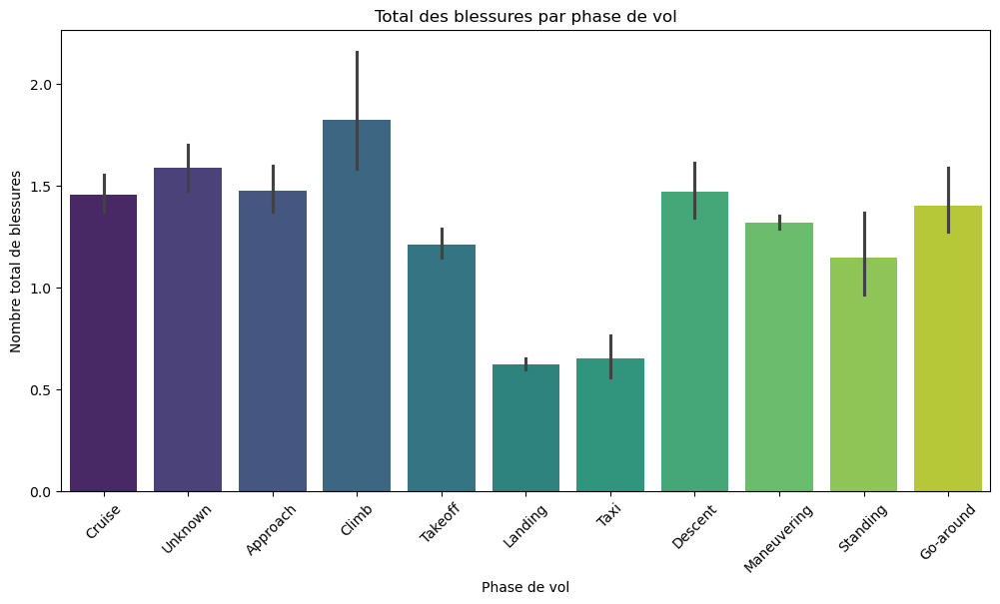

In [120]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='Broad.phase.of.flight', y='Total.Injuries',palette='viridis')

plt.title('Total des blessures par phase de vol')
plt.xlabel('Phase de vol')
plt.ylabel('Nombre total de blessures')
plt.xticks(rotation=45)
plt.show(

On remarque que la phase de montée (Climb) présente le plus grand nombre de blessures, ce qui peut s’expliquer par le fait qu’elle suit immédiatement le décollage — un moment critique où l’avion est encore à basse altitude, avec peu de marge d’erreur en cas de panne moteur ou de perte de contrôle. Ensuite, les phases de croisière (Cruise), approche (Approach) et descente (Descent) ont des niveaux de blessures relativement similaires, ce qui reflète leur fréquence élevée dans les incidents enregistrés. La phase de remise des gaz (Go-around), bien que moins fréquente, montre tout de même un impact notable. Enfin, les autres phases comme le roulage, l’atterrissage ou la montée initiale affichent des nombres plus faibles, sans pour autant être négligées, car elles peuvent toujours entraîner des accidents graves, même si statistiquement moins nombreux.

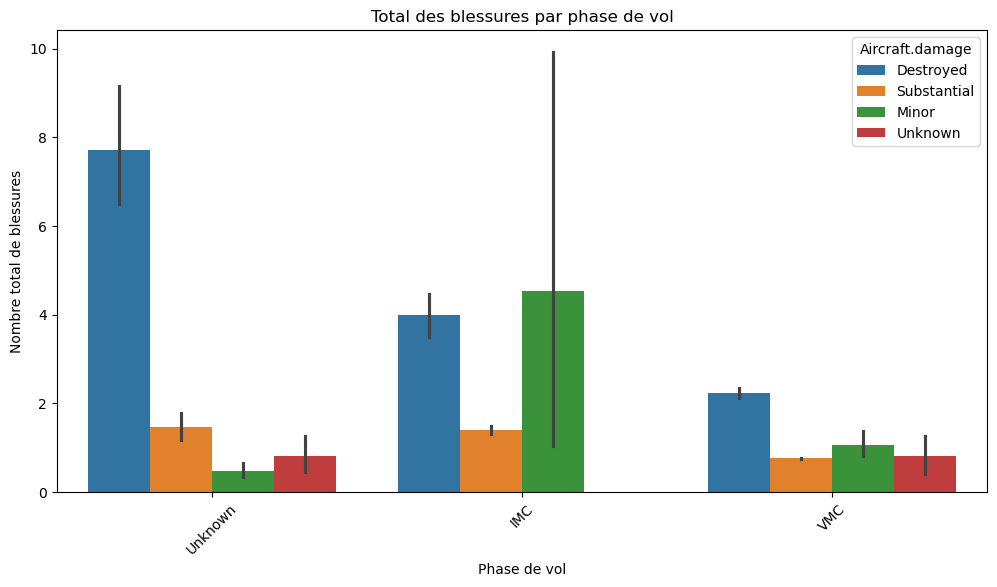

In [121]:
%matplotlib inline

plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='Weather.Condition', y='Total.Injuries',hue='Aircraft.damage')

plt.title('Total des blessures par phase de vol')
plt.xlabel('Phase de vol')
plt.ylabel('Nombre total de blessures')
plt.xticks(rotation=45)
plt.legend(title='Aircraft.damage')
plt.show()

Ce graphique montre le nombre total de blessures en fonction des conditions météorologiques (IMC ou VMC), tout en distinguant les types de dommages subis par l'avion. En conditions VMC (météo favorable), les blessures sont globalement plus élevées, en particulier lorsque les dommages sont mineurs, suivis de destroyed, puis substantial (très faibles). En revanche, en conditions IMC (météo dégradée), les blessures sont moins nombreuses dans l’ensemble, mais on observe un schéma inversé : ce sont les avions détruits qui causent le plus de blessures, suivis de mineurs et substantial. Cela suggère que bien que les accidents soient moins fréquents en IMC, ils peuvent être plus graves lorsqu’ils surviennent, notamment en cas de destruction complète de l’appareil.

EXPLICATION : 
-Pourquoi y a-t-il plus de blessures en VMC qu’en IMC ?
Les vols en VMC (Visual Meteorological Conditions) sont plus nombreux, car ce sont des conditions normales (bonnes conditions météo).
Beaucoup de petits avions (généralement moins résistants) volent uniquement en VMC.
Par conséquent, le volume d’accidents y est naturellement plus élevé, ce qui augmente aussi le nombre total de blessures, même si la gravité moyenne est parfois moindre.


-Pourquoi les blessures sont plus graves en IMC ?
Les vols en IMC (Instrument Meteorological Conditions) se font dans des conditions météo dégradées : nuages, brouillard, pluie, neige, mauvaise visibilité.
Ces vols sont souvent opérés par des avions plus gros ou commerciaux, mais les erreurs en IMC sont moins pardonnables : perte de repères, désorientation spatiale, erreurs d’altitude, etc.
Du coup, quand un accident se produit en IMC, il est souvent plus grave, avec une plus grande probabilité que l’avion soit détruit, ce qui explique que les bars "Destroyed" en IMC soient les plus hautes.

In [122]:
#J'ai regrouper les données par Weather.Condition et j'ai sommer les blessures
donee_groupee= data.groupby('Weather.Condition')[[
    'Total.Fatal.Injuries',
    'Total.Serious.Injuries',
    'Total.Minor.Injuries',
    'Total.Uninjured'
]].sum().fillna(0)

In [123]:
donee_groupee['Total.Fatal.Injuries'].plot(kind='bar', figsize=(12,6))

<Axes: xlabel='Weather.Condition'>

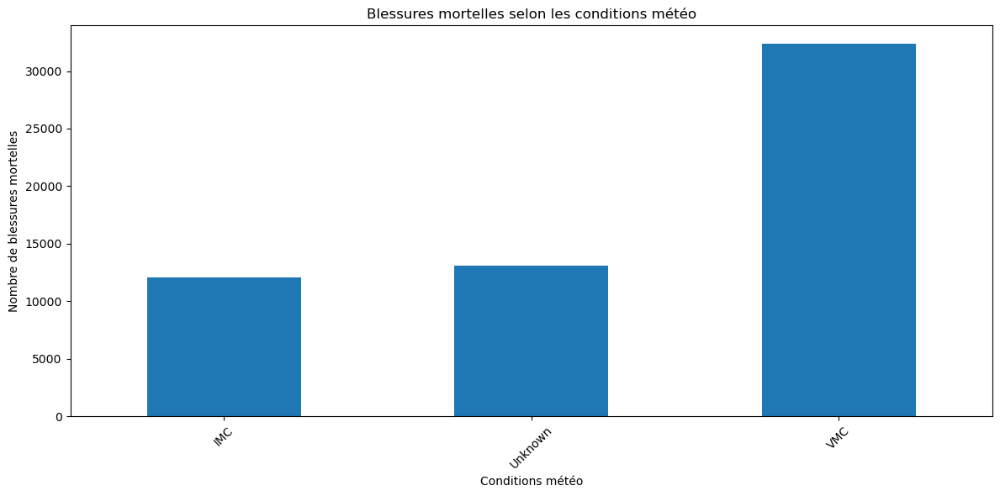

In [124]:
%matplotlib inline
plt.xticks(rotation=45)
plt.xlabel('Conditions météo')
plt.ylabel('Nombre de blessures mortelles')
plt.title('Blessures mortelles selon les conditions météo')
plt.tight_layout()
plt.show()

Le graphique montre que la majorité des blessures mortelles surviennent en conditions VMC (environ 30 000), ce qui s’explique par le fait que la grande majorité des vols ont lieu par beau temps. Les conditions IMC (météo dégradée) sont associées à un nombre beaucoup plus faible de blessures mortelles (environ 12 000), car elles représentent une plus faible proportion des vols dans cette base de données , bien qu’elles soient souvent plus risquées. La troisième barre, intitulée "Unknown", correspond probablement aux cas où les données sur la météo n’étaient pas renseignées ou mal enregistrées lors de l’accident. Cela peut inclure des rapports incomplets.

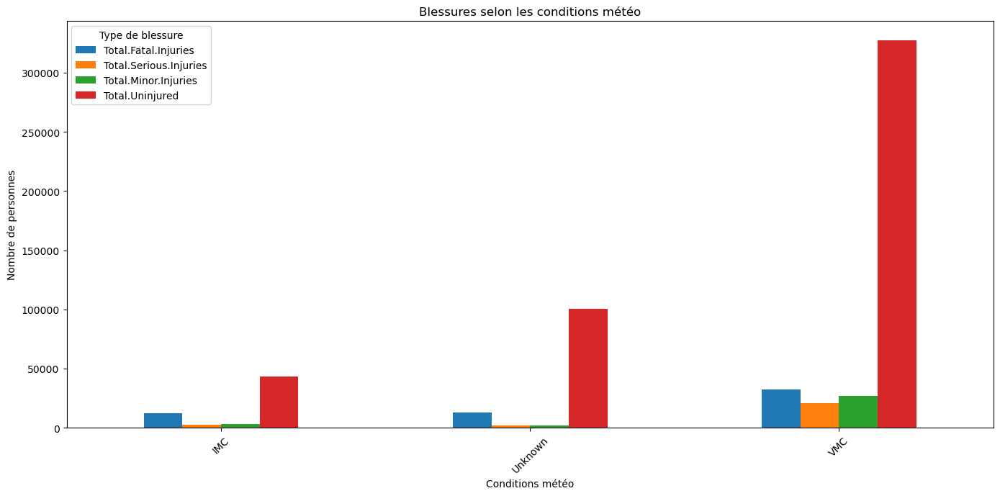

In [125]:
donee_groupee.plot(kind='bar', figsize=(14,7))

plt.xticks(rotation=45)
plt.xlabel('Conditions météo')
plt.ylabel('Nombre de personnes')
plt.title('Blessures selon les conditions météo')
plt.legend(title='Type de blessure')
plt.tight_layout()
plt.show()


Ce graphique compare les différents types de blessures selon les conditions météo. On observe que le groupe VMC (bonnes conditions météo) domine largement, avec environ 300 000 personnes non blessées (Total.Uninjured), suivi par environ 50 000 blessés répartis entre fatal, minor et serious injuries. Cela confirme que la majorité des vols ont lieu en VMC, donc naturellement plus d’accidents y sont enregistrés — même si la gravité moyenne y est moindre.

Dans le groupe IMC, on note environ 50 000 personnes non blessées, mais très peu de blessés (à peine ~1 000 pour les trois types combinés), ce qui reflète que les vols en météo dégradée sont moins fréquents, mais souvent plus critiques. Le groupe "Unknown" montre également peu de données, probablement liées à des informations météo manquantes ou mal enregistrées dans certains rapports.

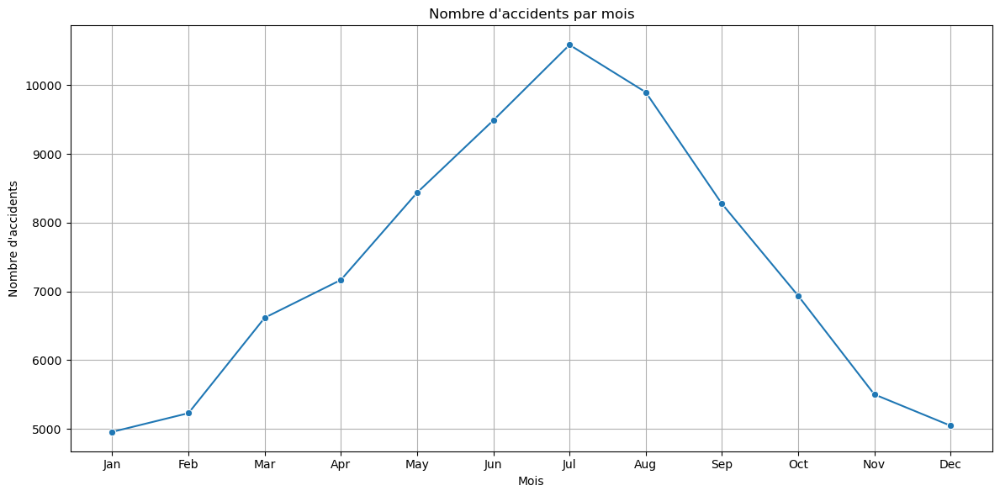

In [131]:
# Convertir Event.Date en datetime
data['Event.Date'] = pd.to_datetime(data['Event.Date'], errors='coerce')

# Extraire le mois
data['Month'] = data['Event.Date'].dt.month

# Compter les accidents par mois
accidents_par_mois = data['Month'].value_counts().sort_index()

# Visualisation
plt.figure(figsize=(12, 6))
sns.lineplot(x=accidents_par_mois.index, y=accidents_par_mois.values, marker='o')
plt.xticks(ticks=range(1, 13), labels=[
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])
plt.title("Nombre d'accidents par mois")
plt.xlabel('Mois')
plt.ylabel("Nombre d'accidents")
plt.grid(True)
plt.tight_layout()
plt.show()


Le graphique en ligne montre un pic d'accidents en juillet, avec une tendance croissante de janvier à juillet, puis une baisse progressive jusqu'à décembre. Cela s'explique logiquement par le fait que la majorité des vols enregistrés dans la base se font en conditions VMC, souvent utilisées pour des activités saisonnières comme skydiving, plus fréquentes en été. Ces types de vols, bien qu'effectués par beau temps, sont plus nombreux et donc statistiquement plus exposés aux incidents.

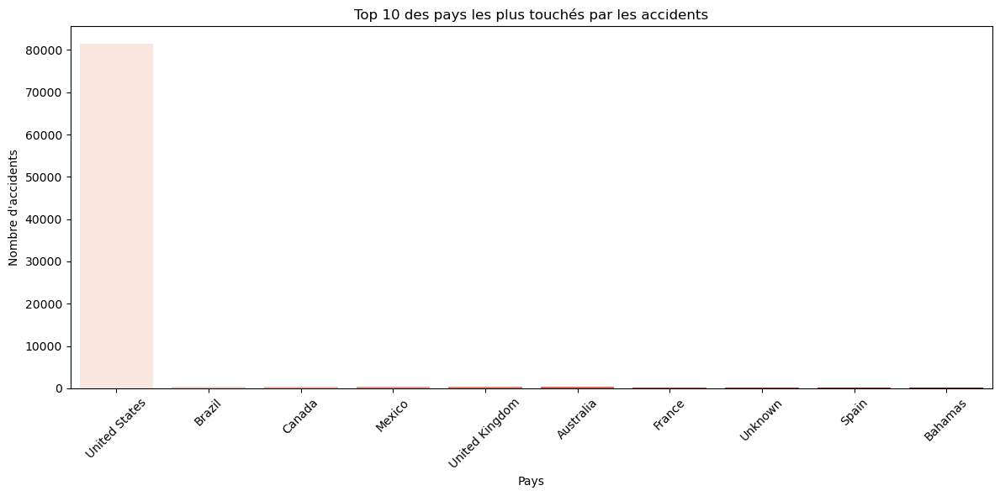

In [144]:
# Top 10 pays avec le plus d'accidents
top_pays = data['Country'].value_counts().nlargest(10)

# Visualisation
plt.figure(figsize=(12, 6))
sns.barplot(x=top_pays.index, y=top_pays.values, palette='Reds')
plt.title('Top 10 des pays les plus touchés par les accidents')
plt.xlabel('Pays')
plt.ylabel("Nombre d'accidents")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Le graphique montre clairement que les États-Unis enregistrent de loin le plus grand nombre d'accidents aériens, bien au-dessus des autres pays. Cela s'explique par la taille de son espace aérien, le volume élevé de trafic, et la présence de nombreux vols privés et d’aviation légère. Derrière, on retrouve le Brésil, le Canada et le Mexique, qui affichent également des niveaux d’activité aérienne importants, bien qu’à une échelle moindre. Cette répartition reflète surtout les pays ayant une aviation civile très développée.

J'ai fais le choix de retirer les Etats-unis, car les autres pays appraissent négligeables à coté 

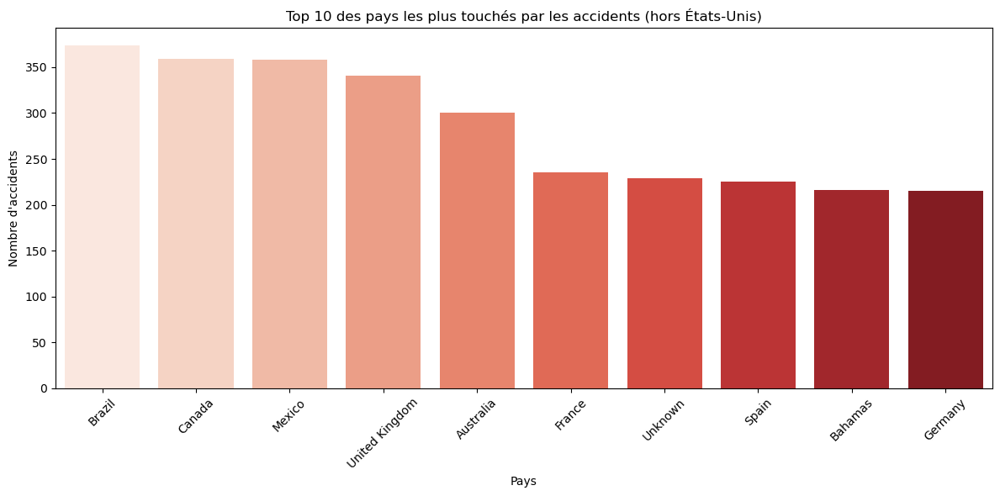

In [146]:
 
top_pays = data['Country'].value_counts()
top_pays = top_pays[top_pays.index != 'United States'].nlargest(10)


plt.figure(figsize=(12, 6))
sns.barplot(x=top_pays.index, y=top_pays.values, palette='Reds')
plt.title('Top 10 des pays les plus touchés par les accidents (hors États-Unis)')
plt.xlabel('Pays')
plt.ylabel("Nombre d'accidents")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


J’ai choisi de retirer les États-Unis du graphique, car leur nombre d’accidents est très élevé et rendait les autres pays visuellement négligeables. Dans ce nouveau graphique, on observe que les pays restants ont un nombre d’accidents assez similaire, variant entre 250 et 350. Les plus touchés sont le Brésil et le Canada, tous deux situés sur le continent américain. À l’inverse, la France, l’Allemagne et l’Espagne (pays européens) comptent parmi les moins touchés. Cela peut refléter des différences dans la taille du trafic aérien, les conditions météo, ou encore les réglementations en matière de sécurité aérienne selon les régions.

In [142]:
#il y'avait des données qui se répétaient donc j'ai du les rassembler tous dans une meme varibale pour ne pas fausser mes données 
data['Make'].replace(['PIPER','Piper'], 'piper', inplace=True)
data['Make'].replace(['BOEING','Boeing'], 'boeing', inplace=True)
data['Make'].replace(['CESSNA','Cessna'], 'cessna', inplace=True)
data['Make'].replace(['BEECH'], 'Beech', inplace=True)

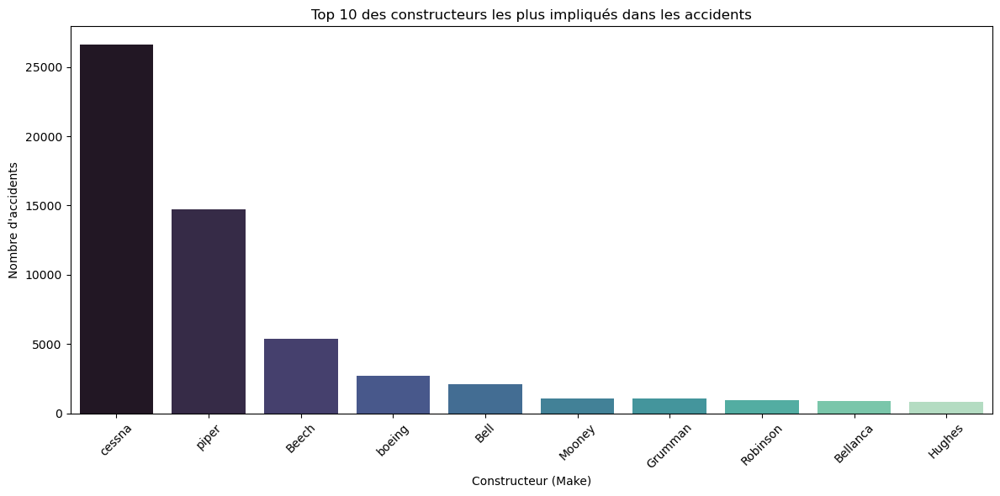

In [143]:
# Top 10 constructeurs
top_makes = data['Make'].value_counts().nlargest(10)

# Visualisation
plt.figure(figsize=(12, 6))
sns.barplot(x=top_makes.index, y=top_makes.values, palette='mako')
plt.title('Top 10 des constructeurs les plus impliqués dans les accidents')
plt.xlabel('Constructeur (Make)')
plt.ylabel("Nombre d'accidents")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Le graphique met en évidence que les constructeurs Cessna, Piper et Beech sont les plus fréquemment impliqués dans les accidents, devant des grands noms comme Boeing ou Bell. Cela s’explique par le fait que Cessna, Piper et Beech produisent principalement des petits avions légers largement utilisés dans l’aviation générale, la formation et les vols privés, qui sont très représentés dans la base. À l’inverse, des constructeurs comme Boeing ou Bell, bien qu’ils opèrent dans des secteurs plus commerciaux ou militaires, ont une part plus faible d’accidents enregistrés ici, mais restent présents du fait de leur volume global.

In [244]:
#je veux créer ma cible sous forme binaire, si total fatal injuries est suéprieure à 1 alors il y'a eu un pmort donc accident fatal sinon non 
data['Fatal_Accident'] = (data['Total.Fatal.Injuries'] > 0).astype(int) 

Après avoir exploré et nettoyé le jeu de données, j’ai corrigé les valeurs manquantes, transformé certaines variables pour les rendre exploitables et visualisé mes données. La visualisation m’a notamment permis d’identifier les phases de vol et les conditions météo les plus associées aux accidents, ainsi que de comparer la gravité des incidents selon différents critères comme le type d’appareil ou la localisation. Cette phase m’a permis de mieux comprendre les données et de vérifier qu’elles sont adaptées à la problématique choisie. J’ai ensuite défini ma variable cible Fatal_Accident, qui indique si un accident a causé au moins un décès. Les variables explicatives telles que les conditions météo, la phase de vol ou le type d’appareil sont prêtes à être utilisées. Je peux désormais passer à l’étape suivante : l’entraînement et l’évaluation de modèles de classification pour prédire la gravité des accidents.


In [240]:
data['Broad.phase.of.flight'].unique()

array(['Cruise', 'Unknown', 'Approach', 'Climb', 'Takeoff', 'Landing',
       'Taxi', 'Descent', 'Maneuvering', 'Standing', 'Go-around'],
      dtype=object)

In [241]:
# première étapa qui est encodage de mes colonnes catégorielles:
weather_mapping = {'IMC': 0, 'VMC': 1, 'Unknown': 2}
aircraft_damage_mapping = {'Minor': 0, 'Substantial': 1, 'Destroyed': 2, 'Unknown': 3}
engine_type_mapping = {
    'Reciprocating':0, 'Others':1, 'Turbo Fan':2, 'Turbo Shaft':3,
       'Turbo Prop':4, 'Turbo Jet':5, 'Electric':6, 'Hybrid Rocket':7,
       'Geared Turbofan':8, 'LR':9
}
phase_mapping = {
    'Cruise':0, 'Unknown':1, 'Approach':2, 'Climb':3, 'Takeoff':4, 'Landing':5,
       'Taxi':6, 'Descent':7, 'Maneuvering':8, 'Standing':9, 'Go-around':10
}

data['Weather.Condition'] = data['Weather.Condition'].map(weather_mapping)
data['Aircraft.damage'] = data['Aircraft.damage'].map(aircraft_damage_mapping)
data['Engine.Type'] = data['Engine.Type'].map(engine_type_mapping)
data['Broad.phase.of.flight'] = data['Broad.phase.of.flight'].map(phase_mapping)

In [198]:
data.head()

,Investigation.Type,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Purpose.of.flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Event.Date,Country,Make,Total.Injuries
0,Accident,Destroyed,Unknown,1.000000,Reciprocating,Personal,2.0,0.000000,0.000000,0.00000,Unknown,Cruise,1948-10-24,United States,Stinson,2.000000
1,Accident,Destroyed,Unknown,1.000000,Reciprocating,Personal,4.0,0.000000,0.000000,0.00000,Unknown,Unknown,1962-07-19,United States,Piper,4.000000
2,Accident,Destroyed,Unknown,1.000000,Reciprocating,Personal,3.0,0.281941,0.359773,5.34176,IMC,Cruise,1974-08-30,United States,Cessna,3.641713
3,Accident,Destroyed,Unknown,1.000000,Reciprocating,Personal,2.0,0.000000,0.000000,0.00000,IMC,Cruise,1977-06-19,United States,Rockwell,2.000000
4,Accident,Destroyed,Unknown,1.147728,Others,Personal,1.0,2.000000,0.359773,0.00000,VMC,Approach,1979-08-02,United States,Cessna,3.359773


In [254]:
data[data['Fatal_Accident'] == 0].head()


,Investigation.Type,Aircraft.damage,Aircraft.Category,Number.of.Engines,Engine.Type,Purpose.of.flight,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Event.Date,Country,Make,Fatal_Accident
7,Accident,1,Airplane,1.0,0,Personal,0.0,0.0,0.0,2.0,1,4,1982-01-01,United States,Cessna,0
8,Accident,1,Airplane,2.0,0,Business,0.0,0.0,0.0,2.0,0,5,1982-01-01,United States,Cessna,0
9,Accident,1,Unknown,1.0,0,Personal,0.0,0.0,3.0,0.0,0,0,1982-01-01,United States,North American,0
10,Accident,1,Unknown,1.0,0,Personal,0.0,0.0,0.0,1.0,1,2,1982-01-01,United States,Piper,0
11,Accident,1,Unknown,1.0,0,Personal,0.0,0.0,0.0,1.0,1,5,1982-01-01,United States,Beech,0


In [245]:
data['Fatal_Accident'].unique()

array([1, 0])

In [246]:
data['Fatal_Accident'].value_counts()

Fatal_Accident
0    59039
1    29101
Name: count, dtype: int64

In [247]:
x = data[['Weather.Condition', 'Aircraft.damage', 'Engine.Type', 'Broad.phase.of.flight']]
y = data['Fatal_Accident']

La cible choisie ici est Fatal_Accident, une variable binaire indiquant si un accident a causé au moins un décès. L’objectif est de prédire la gravité d’un accident à partir de facteurs comme les conditions météo, le type de moteur, la phase de vol et les dommages subis par l’avion. Cette approche permet d’identifier les situations à risque élevé et d’orienter les actions de prévention. 

La problématique: peut-on prédire si un accident sera mortel en fonction de ses caractéristiques contextuelles et techniques ?

In [248]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

In [249]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(x_train, y_train)

RandomForestClassifier(random_state=42)

In [250]:
y_pred = model.predict(x_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification report:\n", classification_report(y_test, y_pred))
print("\nConfusion matrix:\n", confusion_matrix(y_test, y_pred))

Accuracy: 0.7650329022010438

Classification report:
               precision    recall  f1-score   support

           0       0.77      0.92      0.84     11808
           1       0.73      0.45      0.56      5820

    accuracy                           0.77     17628
   macro avg       0.75      0.69      0.70     17628
weighted avg       0.76      0.77      0.75     17628


Confusion matrix:
 [[10846   962]
 [ 3180  2640]]


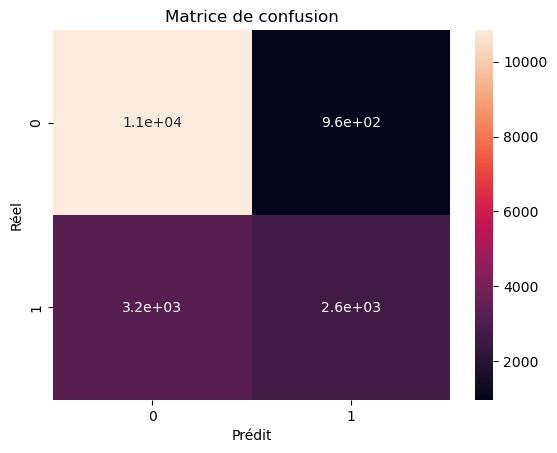

In [251]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


cm = confusion_matrix(y_test, y_pred)


sns.heatmap(cm, annot=True)
plt.xlabel('Prédit')
plt.ylabel('Réel')
plt.title('Matrice de confusion')
plt.show()

In [79]:
from sklearn.linear_model import LogisticRegression
model_logistic = LogisticRegression(max_iter=1000, random_state=42)
model_logistic.fit(x_train, y_train)


y_pred = model_logistic.predict(x_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification report:\n", classification_report(y_test, y_pred))
print("\nConfusion matrix:\n", confusion_matrix(y_test, y_pred))

Accuracy: 0.7599280008999888

Classification report:
               precision    recall  f1-score   support

           0       0.77      0.91      0.84     11935
           1       0.71      0.46      0.56      5843

    accuracy                           0.76     17778
   macro avg       0.74      0.68      0.70     17778
weighted avg       0.75      0.76      0.74     17778


Confusion matrix:
 [[10820  1115]
 [ 3153  2690]]


In [147]:
from sklearn.svm import SVC
model = SVC(kernel='linear', random_state=42)
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification report:\n", classification_report(y_test, y_pred))
print("\nConfusion matrix:\n", confusion_matrix(y_test, y_pred))

Accuracy: 0.7555405557430532

Classification report:
               precision    recall  f1-score   support

           0       0.77      0.90      0.83     11935
           1       0.69      0.46      0.56      5843

    accuracy                           0.76     17778
   macro avg       0.73      0.68      0.69     17778
weighted avg       0.75      0.76      0.74     17778


Confusion matrix:
 [[10720  1215]
 [ 3131  2712]]


In [148]:
from sklearn.model_selection import GridSearchCV
model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [50, 100, 200],        
    'max_depth': [None, 10, 20, 30],       
    'min_samples_split': [2, 5, 10],       
}
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(x_train, y_train)
print("Meilleurs paramètres :", grid_search.best_params_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Meilleurs paramètres : {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 200}


In [149]:

best_model = RandomForestClassifier(max_depth=10, min_samples_split=10, n_estimators=200, random_state=42)

best_model.fit(x_train, y_train)

y_pred = best_model.predict(x_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification report:\n", classification_report(y_test, y_pred))
print("\nConfusion matrix:\n", confusion_matrix(y_test, y_pred))


Accuracy: 0.7665654179322758

Classification report:
               precision    recall  f1-score   support

           0       0.78      0.91      0.84     11935
           1       0.72      0.47      0.57      5843

    accuracy                           0.77     17778
   macro avg       0.75      0.69      0.70     17778
weighted avg       0.76      0.77      0.75     17778


Confusion matrix:
 [[10883  1052]
 [ 3098  2745]]


Pour détecter un overfitting ou un underfitting, on va  comparer :
L'accuracy sur les données d'entraînement (x_train, y_train)
L'accuracy sur les données de test (x_test, y_test) déja calculé en haut qui est de 0.77 

In [151]:
y_train_pred = best_model.predict(x_train)


train_accuracy = accuracy_score(y_train, y_train_pred)
print("Accuracy sur l'entraînement :", train_accuracy)

Accuracy sur l'entraînement : 0.7661543221161283


Les résultats montrent une précision (accuracy) d’environ 0.77 sur les données d’entraînement et de test, ce qui indique que le modèle n’est ni en overfitting ni en underfitting. Le modèle généralise bien : il apprend efficacement sur les données d’entraînement tout en maintenant de bonnes performances sur des données inconnues. Cela en fait un modèle fiable pour prédire si un accident d’aviation sera fatal ou non à partir des variables sélectionnées.  

On va exporter notre modèle Random Forrest 

In [252]:
import joblib
joblib.dump(best_model, 'best_model_RF.pkl')

['best_model_RF.pkl']

Une fois j'ai télécharger mon modèle, je l'ai transposé dans VSC. 
Je vais commencer par encoder mes colonnes 

Voici mon code fait sur VSC pour faire mon application. Ici, j'ai créé une application Streamlit qui permet de prédire si un accident d’aviation sera fatal ou non. L'utilisateur entre quatre informations clés sur le vol (météo, type de dommage, moteur, phase de vol), et le modèle de machine learning chargé (best_model_RF.pkl) utilise ces données pour faire la prédiction.

In [ ]:
import streamlit as st
import joblib
import numpy as np
import pandas as pd


model = joblib.load('best_model_RF.pkl')
st.set_page_config(page_title="Prédiction Accident Aviation", page_icon="✈️", layout="centered")


st.title("Prédiction d'un Accident Fatal d'Aviation ✈️")



weather_mapping = {'IMC': 0, 'VMC': 1, 'Unknown': 2}
aircraft_damage_mapping = {'Minor': 0, 'Substantial': 1, 'Destroyed': 2, 'Unknown': 3}
engine_type_mapping = {
    'Reciprocating':0, 'Others':1, 'Turbo Fan':2, 'Turbo Shaft':3,
       'Turbo Prop':4, 'Turbo Jet':5, 'Electric':6, 'Hybrid Rocket':7,
       'Geared Turbofan':8, 'LR':9
}
phase_mapping = {
    'Cruise':0, 'Unknown':1, 'Approach':2, 'Climb':3, 'Takeoff':4, 'Landing':5,
       'Taxi':6, 'Descent':7, 'Maneuvering':8, 'Standing':9, 'Go-around':10
}

st.subheader("📝 Informations sur le vol")


weather = st.selectbox("🌦️ Condition météo :", list(weather_mapping.keys()))
damage = st.selectbox("✈️ Dommages à l'appareil :", list(aircraft_damage_mapping.keys()))
engine = st.selectbox("⚙️ Type de moteur :", list(engine_type_mapping.keys()))
phase = st.selectbox("🕹️ Phase de vol :", list(phase_mapping.keys()))



if st.button("Prédire l'accident"):
    input_data = np.array([[weather_mapping[weather],
                            aircraft_damage_mapping[damage],
                            engine_type_mapping[engine],
                            phase_mapping[phase]]])
    prediction = model.predict(input_data)

    if prediction[0] == 1:
        st.error("L'accident est probablement fatal.")
    else:
        st.success("L'accident n'est probablement PAS fatal.")


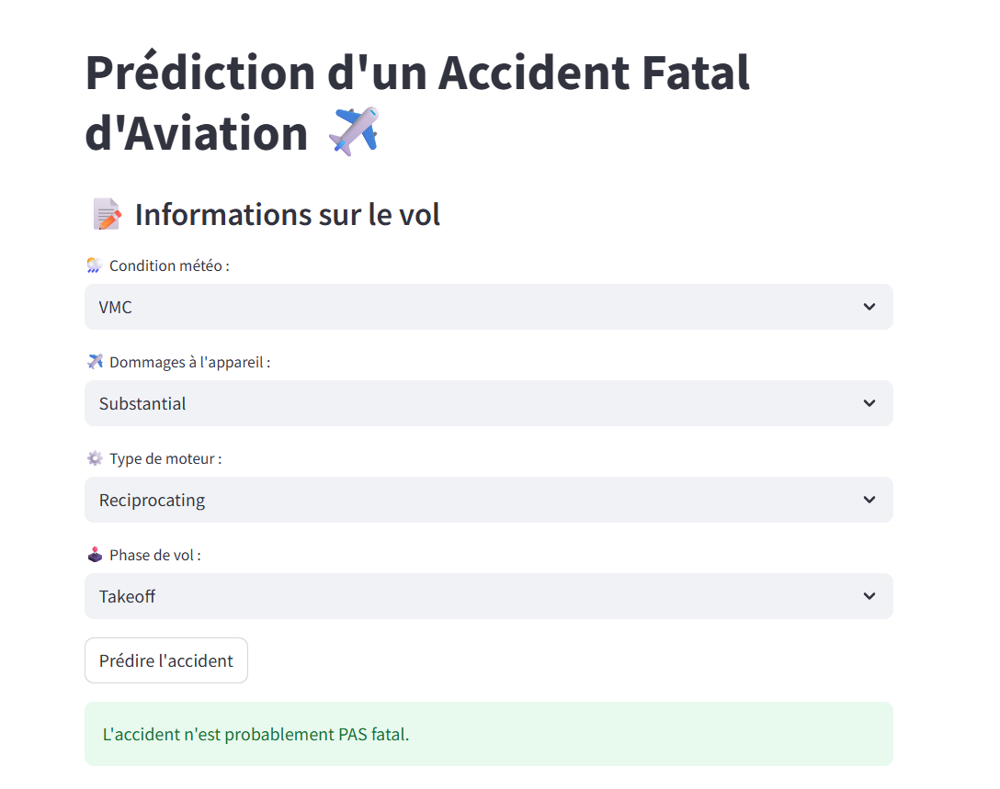

In [256]:

from IPython.display import Image, display

display(Image(filename=r'C:\Users\khema\OneDrive\Images\Captures d’écran\Aviation_Accident_NonFatal.png'))

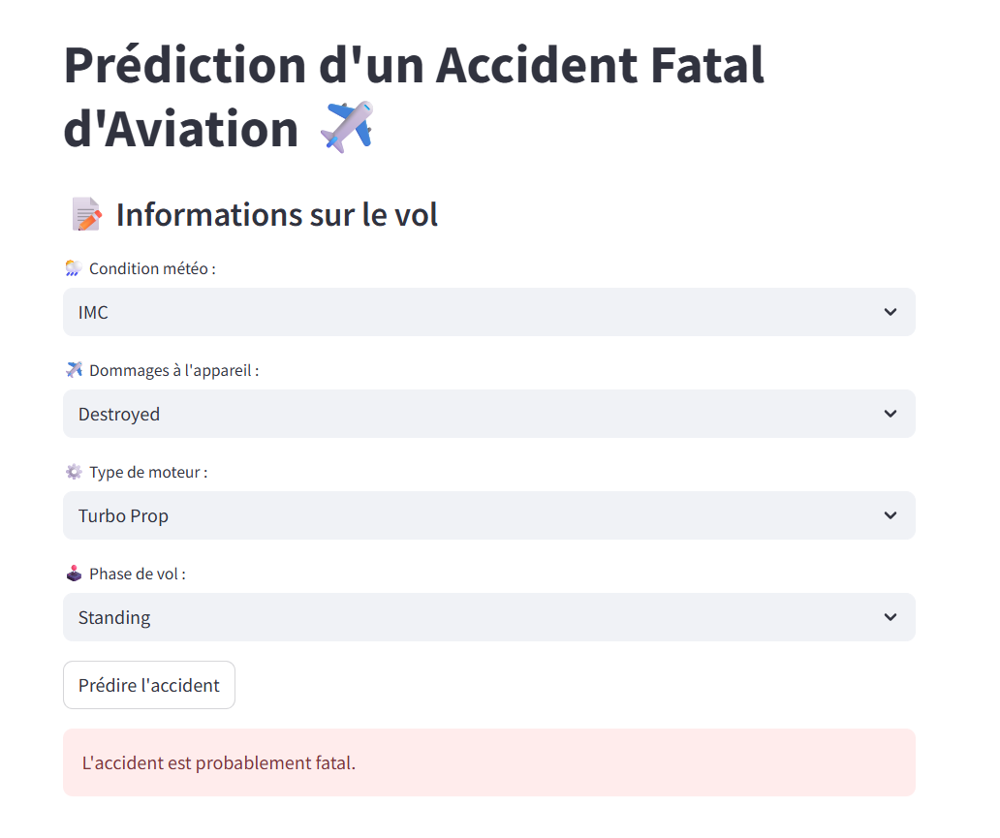

In [257]:
from IPython.display import Image, display

display(Image(filename=r'C:\Users\khema\OneDrive\Images\Captures d’écran\Accident_Aviation_Fatal.png'))